In [20]:
# Before running the code, install top2vec
!pip install gensim==3.8.3
!pip install top2vec

In [2]:
import pandas as pd
from top2vec import Top2Vec

## Training: skip unless you need to train new model

In [22]:
# Load the dataset
data = pd.read_csv('../data/cleaned_data.csv')
data.head()

,Unnamed: 0,title,title.1,body,top_comment_1,top_comment_2,top_comment_3,top_comment_4,top_comment_5,top_comment_6,top_comment_7,top_comment_8,top_comment_9,top_comment_10,verdict
0,0,aita for not taking one of my players complain...,aita for not taking one of my players complain...,i dm for a group of 5 people will lorraine ben...,nta listen youre the dm and seen as the figure...,nta yet because you are taking it seriously th...,nta i think you should talk with her a little ...,nta if she feels uncomfortable because shes in...,nta sounds like holly is being a territorial s...,nah but theres an easy way to solve it dump th...,nta it sounds like the person who made the com...,i would say nah i think holly is certainly ent...,nta likeyoure in charge of the game but youre ...,nah holly has issues of her own most likely an...,not the asshole
1,1,aita for not going to my stepsisters graduatio...,NaN,i 18m just graduated grade 12 this year my you...,nta my response would be thank you for the inv...,so nta and dont go i have never heard of a 7th...,nta what the hell is your step mum messaging y...,nta dont go you would be miserable and angry s...,nta id lie my ass off and say i cant attend be...,nta and i have to say youre being the only res...,nta now that you are 18 you get to pick who yo...,nta you dont feel like partying and are reason...,nta your stepmom and dad are definitely ahs an...,nta they treat you very badly that is a simple...,not the asshole
2,2,aita for not paying half,NaN,a new friend of mine and i discovered we have ...,nta sorry thats not the scope of birthday cele...,nta you dont plan an intimate party with anoth...,nta stop with the jade justify argue defend ex...,nta do not feel bad for standing your ground w...,nta she obviously just wanted to stick you wit...,nta paying for her mistakes doesnt make you an...,nta she is trying to use you and knew it befor...,nta you signed up for an intimate party thats ...,you said x she agreed and now wants to to pay ...,nta i think the number of people and maximum b...,not the asshole
3,3,aita for potentially getting my upstairs neigh...,NaN,im really conflicted with this so id like some...,nta you are well within your rights to complai...,nta this is not you being petty im surprised m...,sorry but you dont move into an apartment comp...,nta water overflowing into your apartment is d...,nta maybe theyve received similar warning and ...,nta you arent getting anyone evicted they are ...,its super weird that management would send you...,nta you need to look as the kids have nothing ...,nta its not you who is making them homeless it...,nta repeated bathtub overflows caused a massiv...,not the asshole
4,4,aita for demanding to go through my partners p...,aita for demanding to go through my partners p...,for context weve been dating for 15 years also...,nta i feel like most people would have gone sn...,nta if there was nothing to hide i wouldve sho...,man this is a tough one to be honest im really...,yta either trust her or dont and decide where ...,nta it honestly blows me away how many people ...,yta simply for demanding to go through her pho...,nta shes hiding something your lack of trust i...,yta 15 years together with no stated reasons o...,esh its a really crappy situation but if you t...,esh these commentors act like no one cheats or...,asshole


In [61]:
# Extract the relevant text data (e.g., the 'body' column)
documents = data['body'].dropna().tolist()

In [62]:
# Create the Top2Vec model
model = Top2Vec(documents, embedding_model='doc2vec', speed="fast-learn", topic_merge_delta=0.2, workers=16)

2024-10-18 11:35:16,689 - top2vec - INFO - Pre-processing documents for training
2024-10-18 11:35:31,957 - top2vec - INFO - Creating joint document/word embedding
2024-10-18 11:51:19,748 - top2vec - INFO - Creating lower dimension embedding of documents
2024-10-18 11:54:40,681 - top2vec - INFO - Finding dense areas of documents
2024-10-18 11:54:43,577 - top2vec - INFO - Finding topics


In [65]:
# save and load model
modelname = "REPLAEC_WITH_MODEL_NAME"
model.save(modelname)


## Analysis: functions

In [8]:
# Print each topics
def print_topics(model, modelname=""):
    print(f"{modelname}\n")
    topic_words, word_scores, topic_nums = model.get_topics()
    for i, topic in enumerate(topic_words):
        print(f"\nTopic {i + 1}:")
        print(", ".join(topic))
    print("\n")
    return

In [15]:
# print word clouds for each topic
def print_word_clouds(model, modelname=""):
    print(f"{modelname}\n")
    topic_words, word_scores, topic_nums = model.get_topics()
    for topic_num in topic_nums:
        model.generate_topic_wordcloud(topic_num)
    print("\n")
    return 

In [24]:
# Plot into 2D using UMAP

import pandas as pd
from top2vec import Top2Vec
import umap
import matplotlib.pyplot as plt

def print_umap(model, modelname=""):
    # Get the document and topic vectors
    doc_vectors = model.document_vectors
    topic_vectors = model.topic_vectors

    # Use UMAP to reduce document and topic vectors to 2D
    umap_model = umap.UMAP(n_components=2, random_state=42)
    doc_vectors_2d = umap_model.fit_transform(doc_vectors)
    topic_vectors_2d = umap_model.transform(topic_vectors)

    # Plot the results
    plt.figure(figsize=(10, 7))

    # Plot the document vectors in blue
    plt.scatter(doc_vectors_2d[:, 0], doc_vectors_2d[:, 1], c='blue', alpha=0.5, label='Documents', s=1)

    # Plot the topic vectors in red
    plt.scatter(topic_vectors_2d[:, 0], topic_vectors_2d[:, 1], c='red', label='Topics', s=100)

    # Add labels and title
    plt.title(f"Top2Vec Model Visualization in 2D {modelname}")
    plt.xlabel("UMAP Dimension 1")
    plt.ylabel("UMAP Dimension 2")
    plt.legend()

    # Show the plot
    plt.show()
    return

## Analysis: Visualizations

Please replace "modelname" to visualize different model

In [11]:
# load the model
models = {}

models['models_title_01'] = Top2Vec.load("models/top2vec_title_doc2vec_0.1")
models['models_title_02'] = Top2Vec.load("models/top2vec_title_doc2vec_0.2")
models['models_body_01'] = Top2Vec.load("models/top2vec_body_doc2vec_0.1")
models['models_body_02'] = Top2Vec.load("models/top2vec_body_doc2vec_0.2")


In [18]:
modelname = 'models_title_01'
print_topics(models[modelname], modelname)

models_title_01


Topic 1:
aitah, visit, bfs, demanding, mum, public, classmate, all, playing, ex, place, close, cousins, an, own, class, having, then, says, dead, order, gf, around, girls, property, yo, person, toddler, new, accepting, post, first, kid, neighbor, mother, yelling, amp, always, while, exs, sick, trying, breaking, things, very, hospital, really, make, this, our

Topic 2:
charging, fiances, cousins, neighbours, meat, bf, good, partners, moms, property, toddler, store, stepdaughter, other, big, cutting, gf, yo, myself, offering, bills, are, lunch, cops, trying, having, ruined, while, kids, supporting, police, thinking, dead, cry, pictures, mils, public, said, member, including, bfs, apartment, deceased, everything, demanding, grandma, broke, funeral, comment, fun

Topic 3:
full, shouldnt, chores, rules, annoyed, wrong, embarrassing, anything, fake, spending, way, really, am, aunt, did, kick, exs, expensive, complaining, people, what, wants, cook, reason, honest, truth, fee

models_title_01





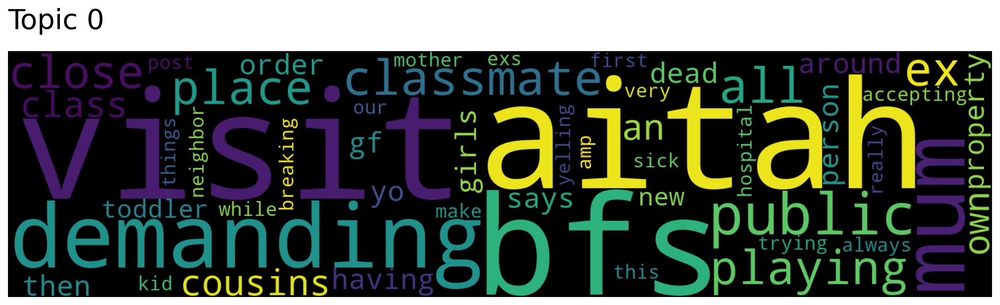

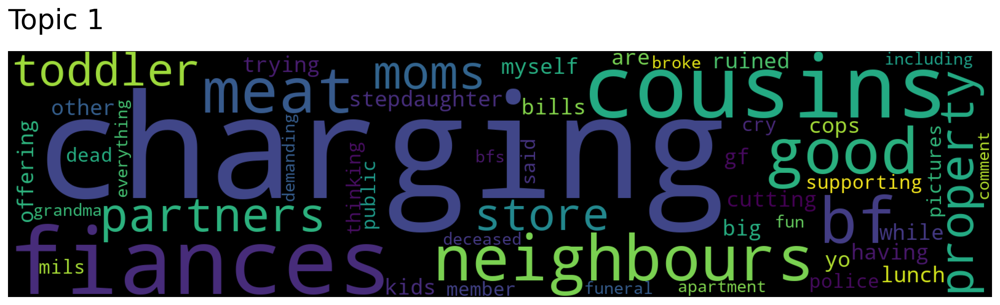

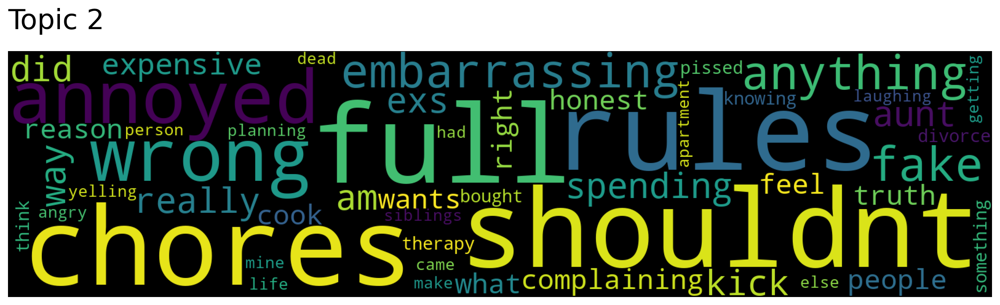

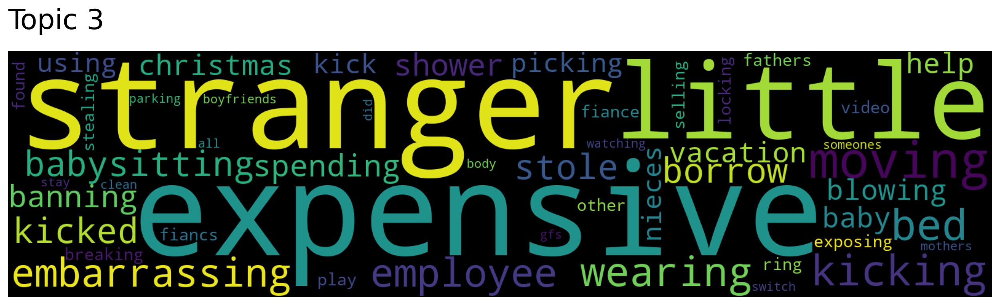

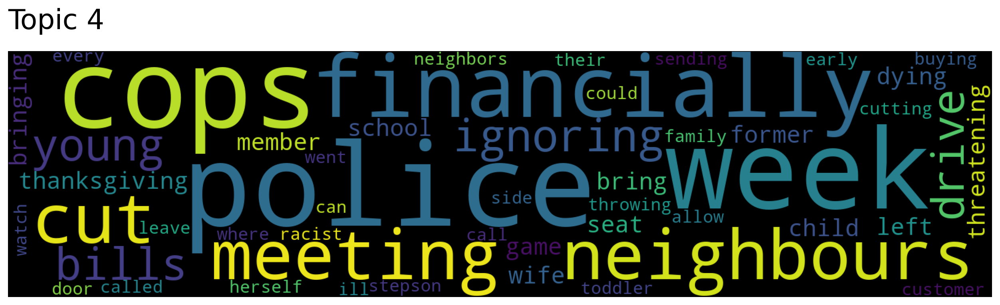

...

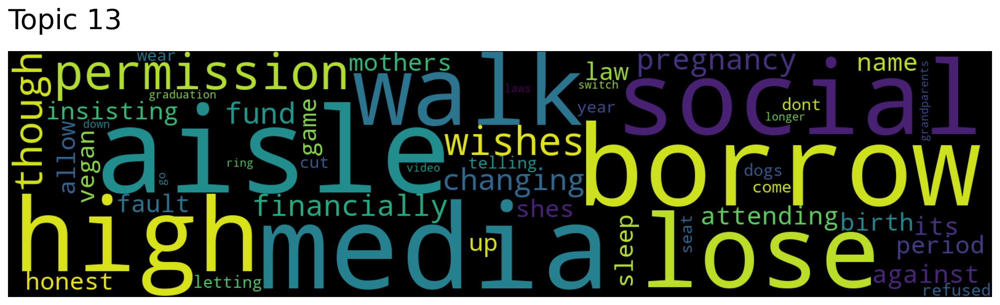

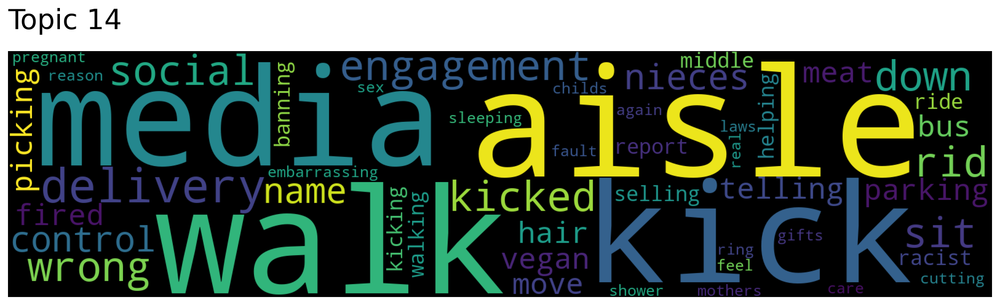

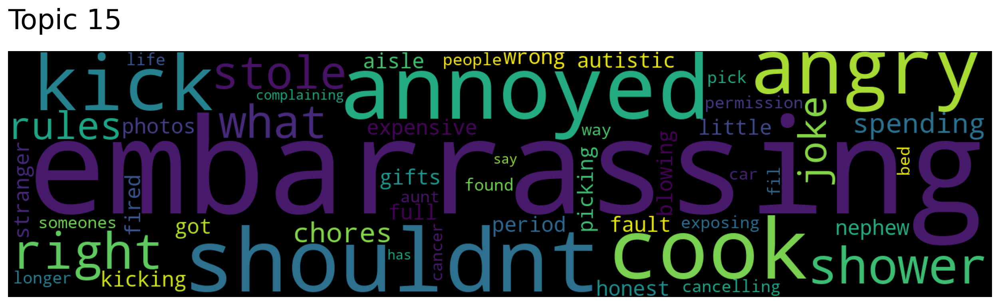

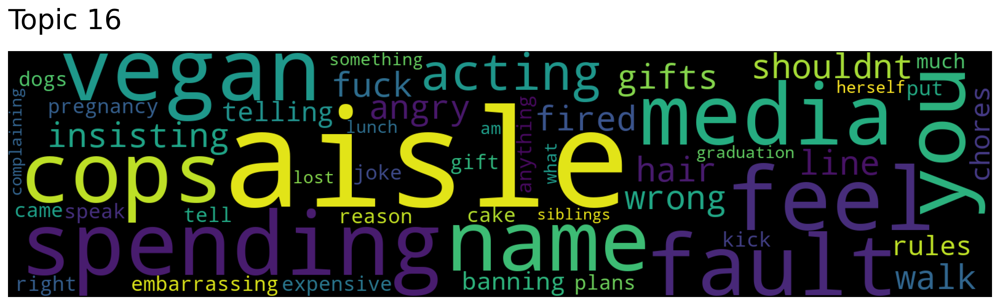

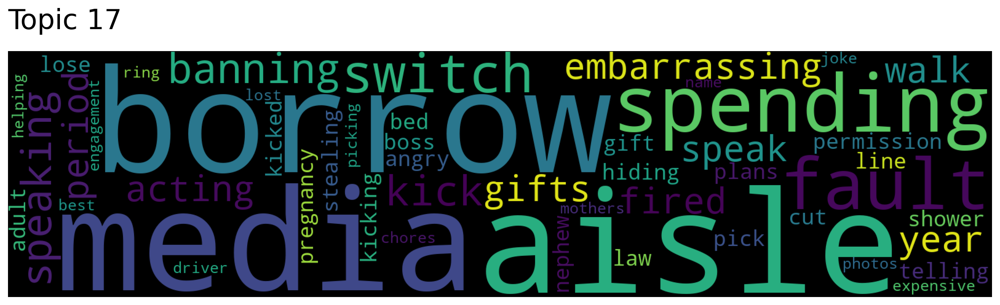

In [19]:
print_word_clouds(models[modelname], modelname)

/opt/anaconda3/envs/ml_hw1/lib/python3.11/site-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")
OMP: Info #276: omp_set_nested routine deprecated, please use omp_set_max_active_levels instead.


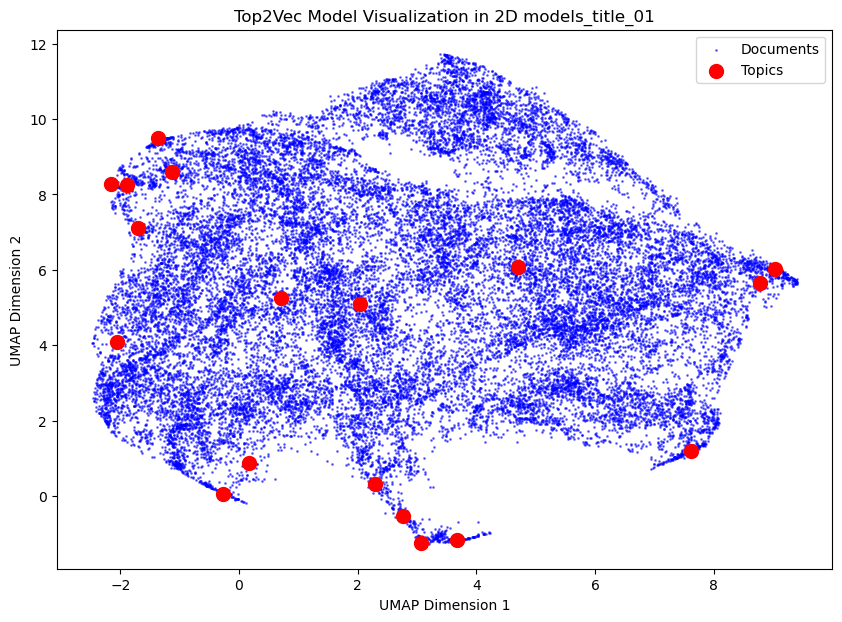

In [25]:
print_umap(models[modelname], modelname)